# Import Libraries

In [2]:
#Importing libraries

import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
from scipy import stats
import seaborn as sns
import pickle 
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import cross_val_score, train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.svm import SVR
from math import sqrt

# Data understanding

In [3]:
#Reading Data from the dataset

student_df = pd.read_csv('student.csv')
student_df

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,20,U,LE3,A,2,2,services,services,...,5,5,4,4,5,4,11,9,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,3,14,16,16
392,MS,M,21,R,GT3,T,1,1,other,other,...,5,5,3,3,3,3,3,10,8,7
393,MS,M,18,R,LE3,T,3,2,services,other,...,4,4,1,3,4,5,0,11,12,10


In [4]:
# Getting the columns and rows of the DataFrame

student_df.shape

(395, 33)

In [5]:
# Get all the column names

student_df.columns.values

array(['school', 'sex', 'age', 'address', 'famsize', 'Pstatus', 'Medu',
       'Fedu', 'Mjob', 'Fjob', 'reason', 'guardian', 'traveltime',
       'studytime', 'failures', 'schoolsup', 'famsup', 'paid',
       'activities', 'nursery', 'higher', 'internet', 'romantic',
       'famrel', 'freetime', 'goout', 'Dalc', 'Walc', 'health',
       'absences', 'G1', 'G2', 'G3'], dtype=object)

In [6]:
# Display the data types for each column in the dataset

student_df.dtypes

school        object
sex           object
age            int64
address       object
famsize       object
Pstatus       object
Medu           int64
Fedu           int64
Mjob          object
Fjob          object
reason        object
guardian      object
traveltime     int64
studytime      int64
failures       int64
schoolsup     object
famsup        object
paid          object
activities    object
nursery       object
higher        object
internet      object
romantic      object
famrel         int64
freetime       int64
goout          int64
Dalc           int64
Walc           int64
health         int64
absences       int64
G1             int64
G2             int64
G3             int64
dtype: object

In [7]:
# Show the summary of DataFrames structure  data types and non-null counts

student_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 33 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      395 non-null    object
 1   sex         395 non-null    object
 2   age         395 non-null    int64 
 3   address     395 non-null    object
 4   famsize     395 non-null    object
 5   Pstatus     395 non-null    object
 6   Medu        395 non-null    int64 
 7   Fedu        395 non-null    int64 
 8   Mjob        395 non-null    object
 9   Fjob        395 non-null    object
 10  reason      395 non-null    object
 11  guardian    395 non-null    object
 12  traveltime  395 non-null    int64 
 13  studytime   395 non-null    int64 
 14  failures    395 non-null    int64 
 15  schoolsup   395 non-null    object
 16  famsup      395 non-null    object
 17  paid        395 non-null    object
 18  activities  395 non-null    object
 19  nursery     395 non-null    object
 20  higher    

In [8]:
# Display summary statistics of numeric columns in the DataFrame

student_df.describe()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
count,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000,395.000000
mean,16.696203,2.749367,2.521519,1.448101,2.035443,0.334177,3.944304,3.235443,3.108861,1.481013,2.291139,3.554430,5.708861,10.908861,10.713924,10.415190
std,1.276043,1.094735,1.088201,0.697505,0.839240,0.743651,0.896659,0.998862,1.113278,0.890741,1.287897,1.390303,8.003096,3.319195,3.761505,4.581443
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,3.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,1.000000,1.000000,0.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,0.000000,8.000000,9.000000,8.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,4.000000,11.000000,11.000000,11.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,8.000000,13.000000,13.000000,14.000000
max,22.000000,4.000000,4.000000,4.000000,4.000000,3.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,75.000000,19.000000,19.000000,20.000000


In [9]:
# Display the first five rows of the DataFrame

student_df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


In [10]:
# Display the last five rows of the DataFrame

student_df.tail()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
390,MS,M,20,U,LE3,A,2,2,services,services,...,5,5,4,4,5,4,11,9,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,3,14,16,16
392,MS,M,21,R,GT3,T,1,1,other,other,...,5,5,3,3,3,3,3,10,8,7
393,MS,M,18,R,LE3,T,3,2,services,other,...,4,4,1,3,4,5,0,11,12,10
394,MS,M,19,U,LE3,T,1,1,other,at_home,...,3,2,3,3,3,5,5,8,9,9


## Data Visualization

In [11]:
# Identify the categorical columns
categorical_columns = student_df.select_dtypes(include=['object', 'category']).columns
print(categorical_columns)

Index(['school', 'sex', 'address', 'famsize', 'Pstatus', 'Mjob', 'Fjob',
       'reason', 'guardian', 'schoolsup', 'famsup', 'paid', 'activities',
       'nursery', 'higher', 'internet', 'romantic'],
      dtype='object')


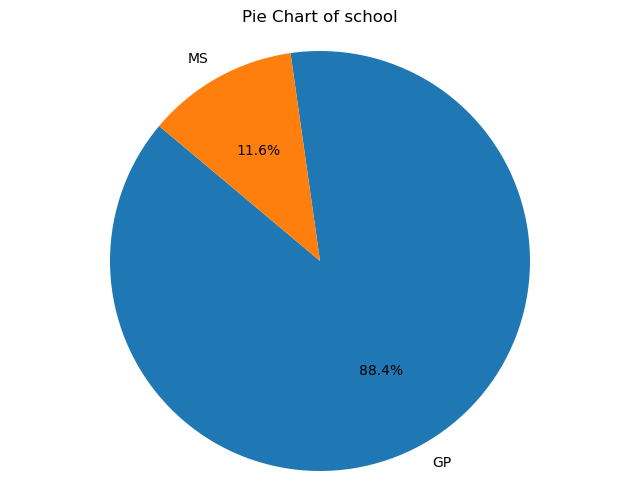

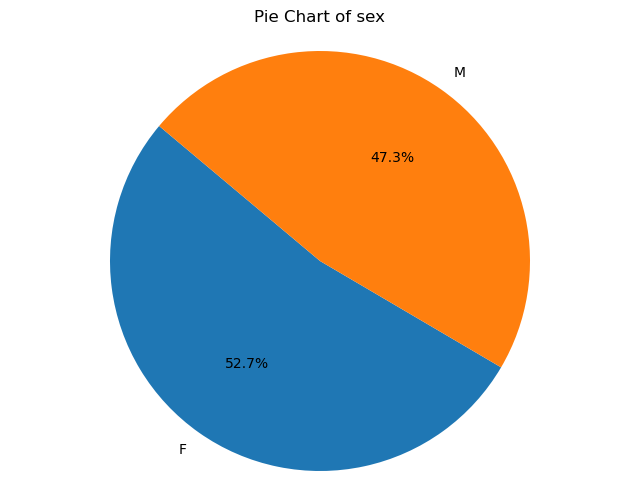

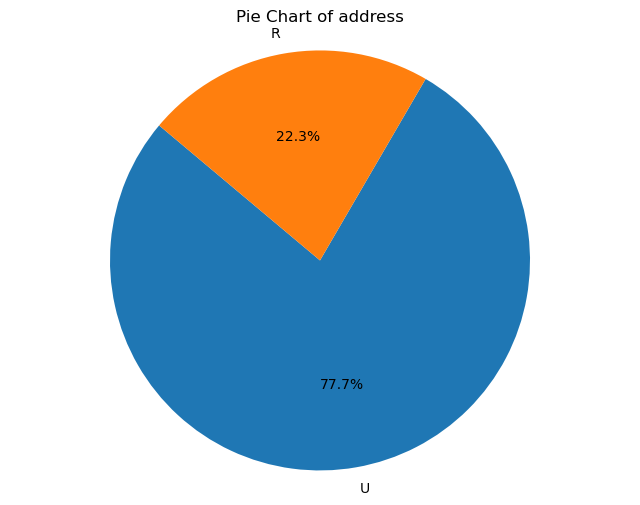

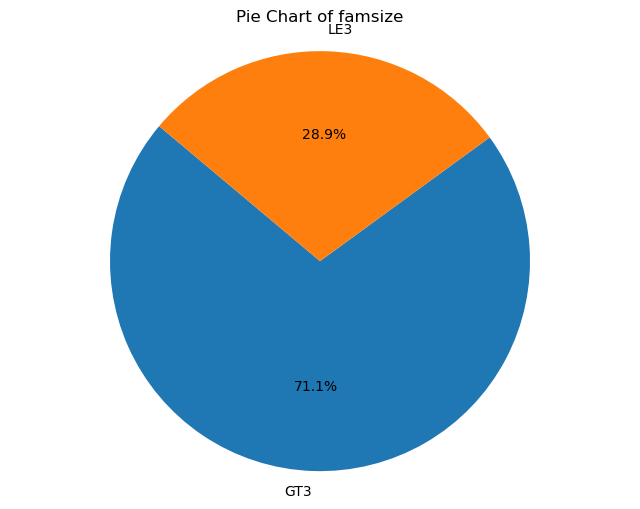

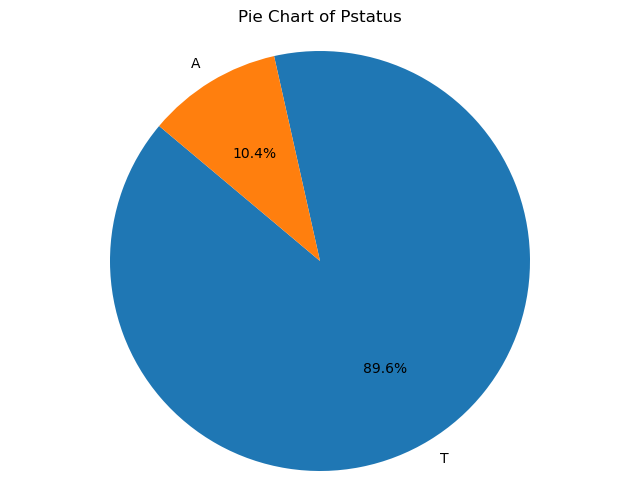

...

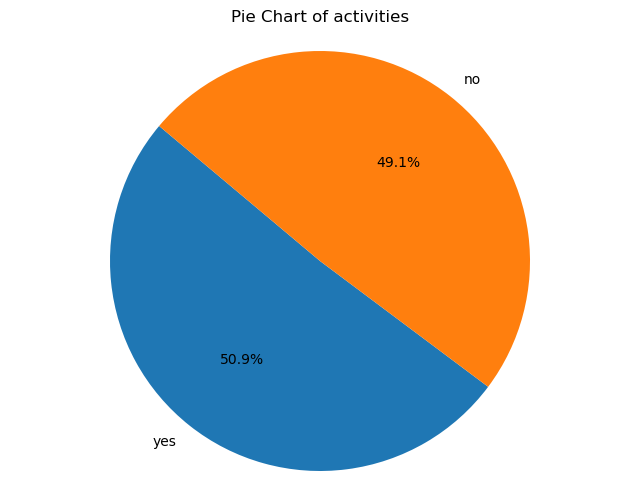

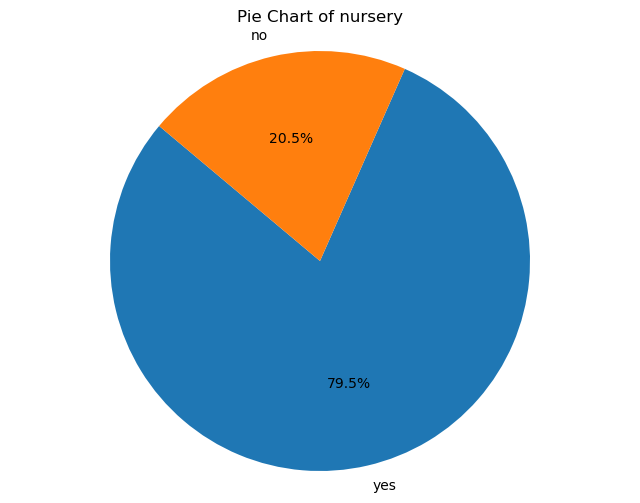

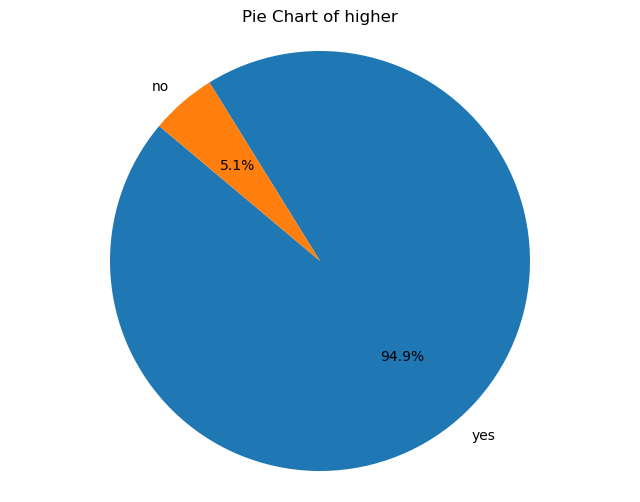

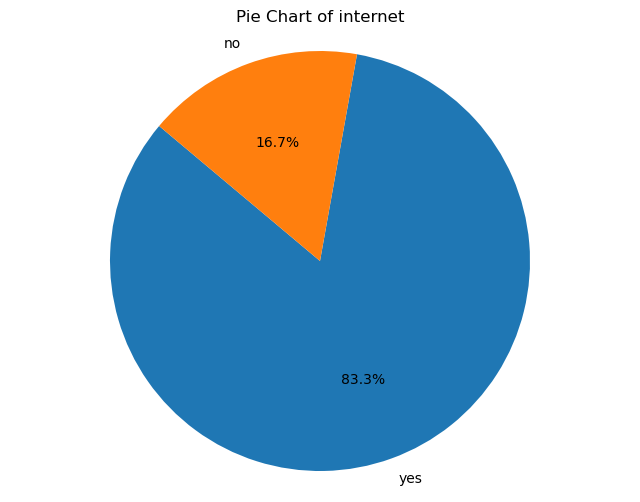

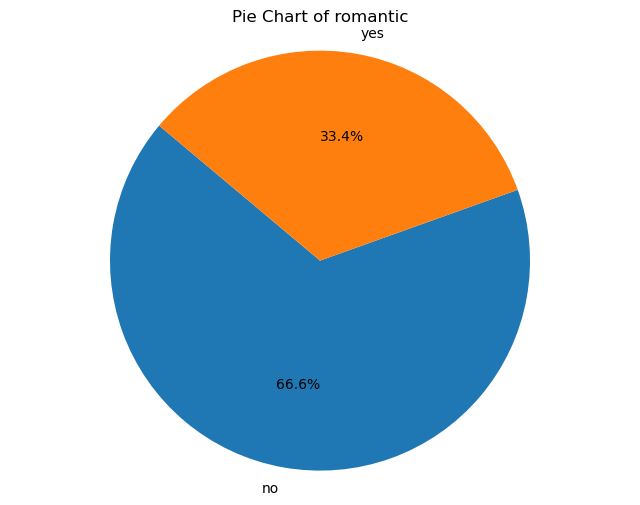

In [12]:
# Loop through each categorical column and plot the pie charts
for column in categorical_columns:
    
    value_counts = student_df[column].value_counts()   # Get the value counts for the column (excluding NaN values)

    # Plot a pie chart
    plt.figure(figsize=(8, 6))
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie Chart of {column}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    # Display the plot
    plt.show()


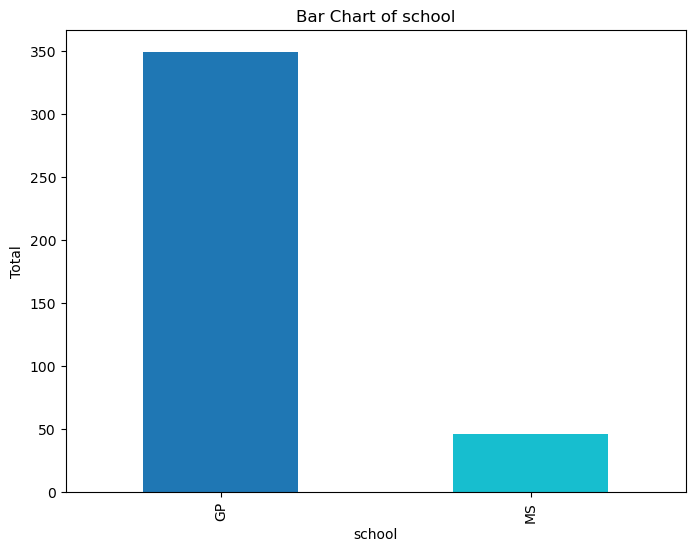

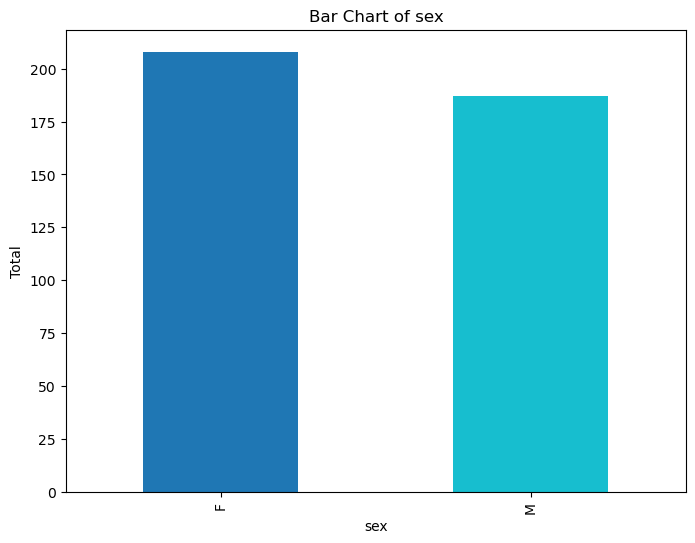

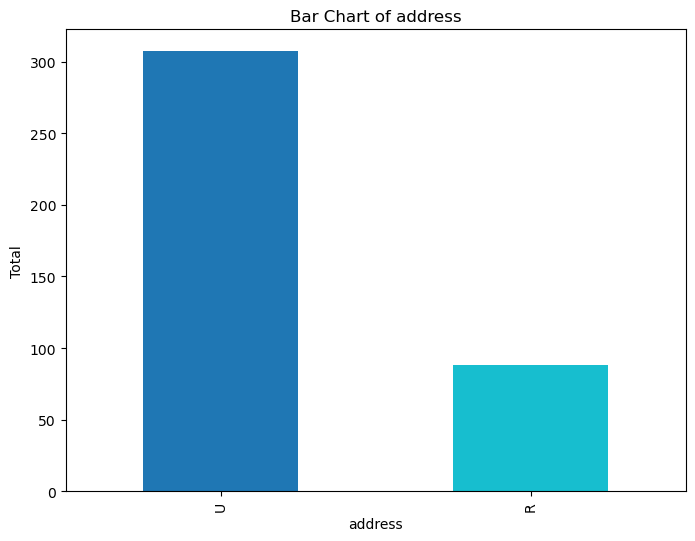

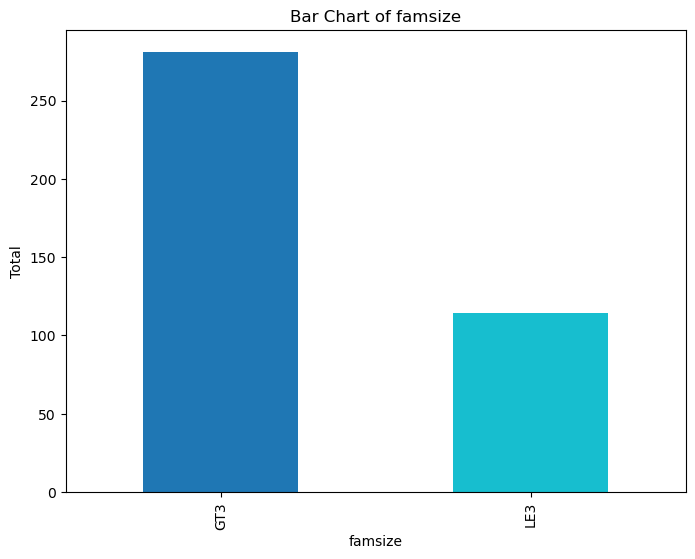

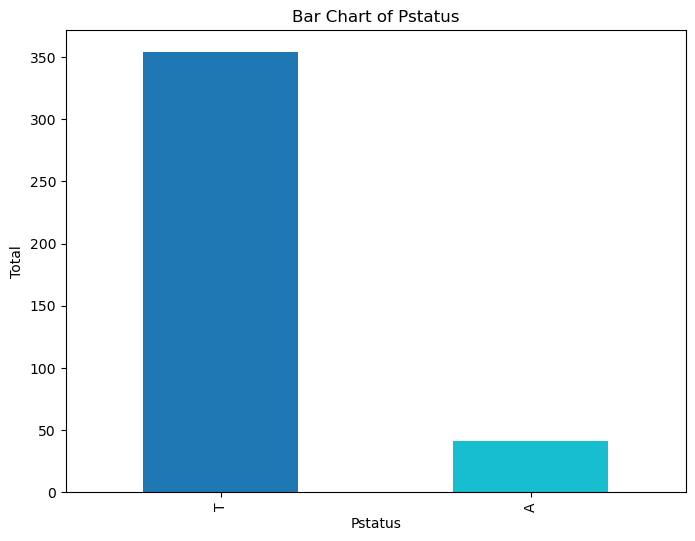

...

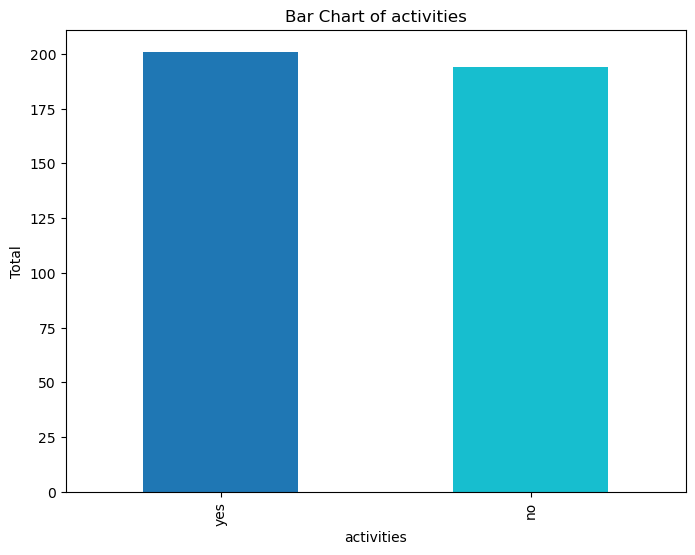

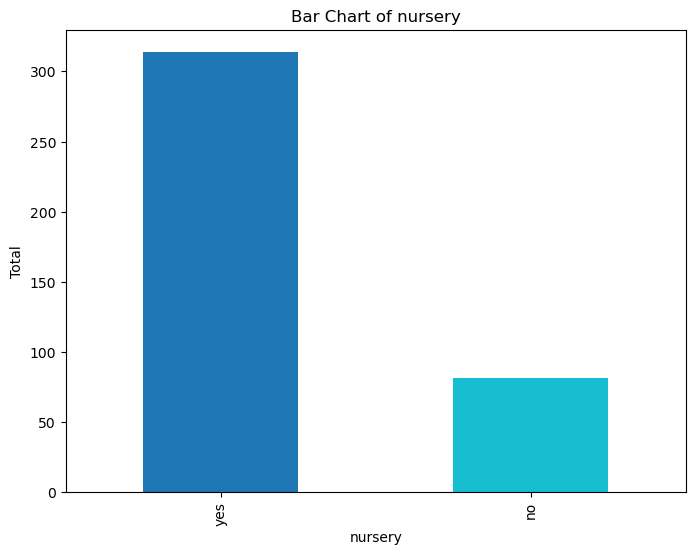

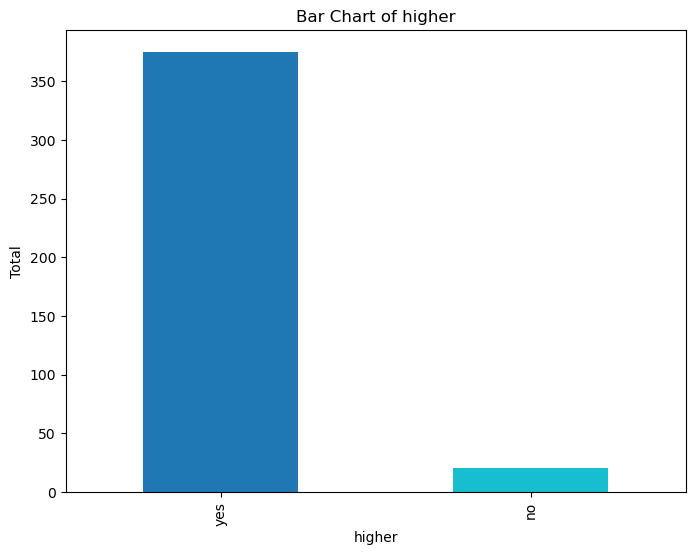

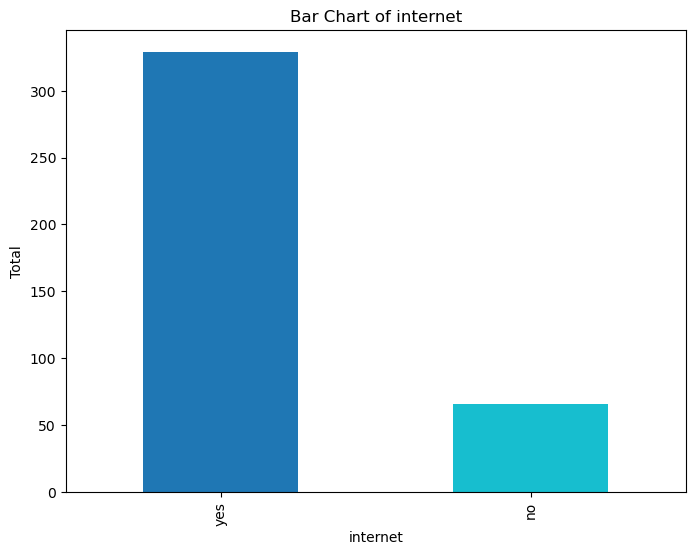

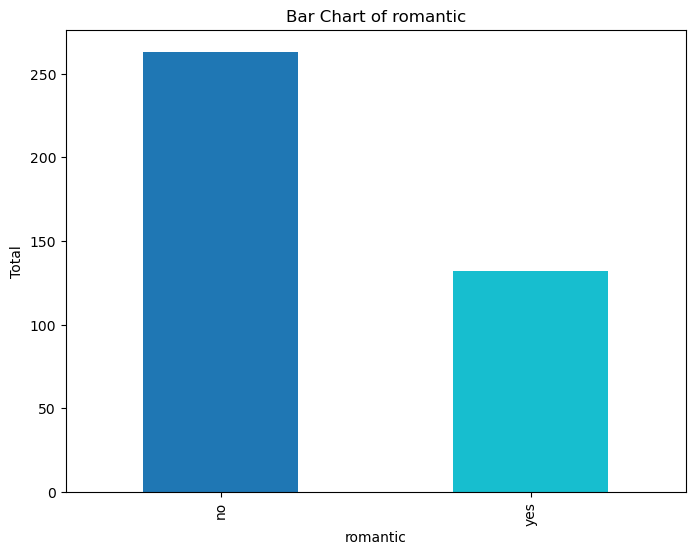

In [13]:
# Loop through each categorical column and plot bar charts
for column in categorical_columns:
    # Check if the column is categorical or numerical
    if student_df[column].dtype == 'object' or student_df[column].dtype.name == 'category':
        plt.figure(figsize=(8, 6))
        # Get the unique category in the column
        unique_values = student_df[column].unique()
        # Generate a color for each unique category
        colors = plt.colormaps['tab10'](np.linspace(0, 1, len(unique_values)))
        # Plot the bar chart with different colors for each bar
        student_df[column].value_counts().plot(kind='bar', color=colors)
        plt.title(f'Bar Chart of {column}')
        plt.xlabel(column)
        plt.ylabel('Total')
        plt.show()

# Data Cleaning

In [14]:
#Count the number of duplicated rows in the DataFrame

student_df.duplicated().sum()

0

In [15]:
# Check for missing values in the DataFrame

print(student_df.isnull().sum())

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G1            0
G2            0
G3            0
dtype: int64


# Data Preparation

In [16]:
# Select columns with data type 'object'
student_df.select_dtypes(include = 'object')

,school,sex,address,famsize,Pstatus,Mjob,Fjob,reason,guardian,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic
0,GP,F,U,GT3,A,at_home,teacher,course,mother,yes,no,no,no,yes,yes,no,no
1,GP,F,U,GT3,T,at_home,other,course,father,no,yes,no,no,no,yes,yes,no
2,GP,F,U,LE3,T,at_home,other,other,mother,yes,no,yes,no,yes,yes,yes,no
3,GP,F,U,GT3,T,health,services,home,mother,no,yes,yes,yes,yes,yes,yes,yes
4,GP,F,U,GT3,T,other,other,home,father,no,yes,yes,no,yes,yes,no,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,U,LE3,A,services,services,course,other,no,yes,yes,no,yes,yes,no,no
391,MS,M,U,LE3,T,services,services,course,mother,no,no,no,no,no,yes,yes,no
392,MS,M,R,GT3,T,other,other,course,other,no,no,no,no,no,yes,no,no
393,MS,M,R,LE3,T,services,other,course,mother,no,no,no,no,no,yes,yes,no


In [17]:
# List of categorical columns
categorical_columns = ["school", "sex", "address", "famsize", "Pstatus", "Mjob", "Fjob", "reason", "guardian",
                       "schoolsup", "famsup", "paid", "activities", "nursery", "higher", "internet", "romantic"]

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply Label Encoding
for col in categorical_columns:
    student_df[col] = label_encoder.fit_transform(student_df[col])
        
student_df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,0,0,18,1,0,0,4,4,0,4,...,4,3,4,1,1,3,6,5,6,6
1,0,0,17,1,0,1,1,1,0,2,...,5,3,3,1,1,3,4,5,5,6
2,0,0,15,1,1,1,1,1,0,2,...,4,3,2,2,3,3,10,7,8,10
3,0,0,15,1,0,1,4,2,1,3,...,3,2,2,1,1,5,2,15,14,15
4,0,0,16,1,0,1,3,3,2,2,...,4,3,2,1,2,5,4,6,10,10


# Data Discovery and Profiling

## Pairplot

Text(0.5, 1.0, 'Correlation Heatmap with Label Encoder')

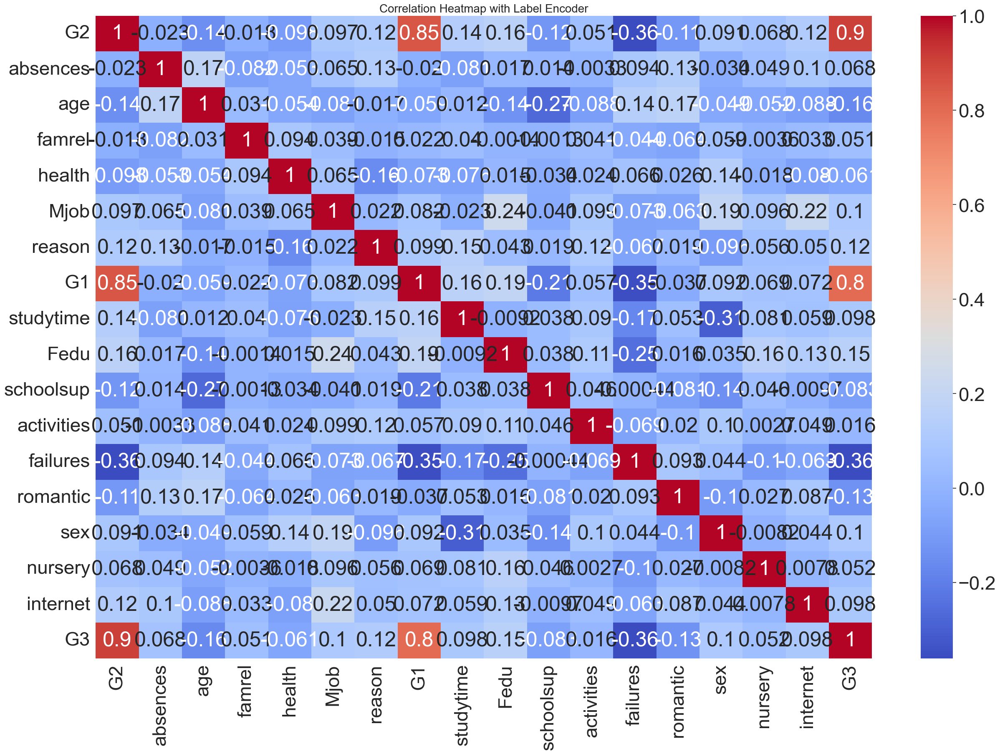

In [42]:
# Calculate the correlation matrix
corr = student_df.corr()

# Create a figure with adjustable size
plt.figure(figsize=(30,20))

# Plot the heatmap using seaborn
sns.heatmap(corr, annot=True, cmap="coolwarm")

# Set the title of the plot
plt.title('Correlation Heatmap with Label Encoder', fontsize=20)

## Pairplot

In [29]:
# Calculate vizualize scatterchart and histogram
sns.set(font_scale=3)
sns.pairplot(student_df, hue = "address")

C:\Users\kingy\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


# Outlier Detection

In [30]:
# calculating the Z-scores of all features
z_scores = np.abs(stats.zscore(student_df.select_dtypes(include=[np.number])))

# defines a threshold to identify outliers
threshold = 3

# see how many outliers are present in each column
outliers = (z_scores > threshold).sum(axis=0)

# total number of outliers 
total_outliers = outliers.sum().sum()

# displays the number of outliers per feature and the total outliers
print(f"Outliers per feature:\n{outliers}")
print("Total Outliers: ", total_outliers)

Outliers per feature:
school         0
sex            0
age            0
address        0
famsize        0
Pstatus        0
Medu           0
Fedu           0
Mjob           0
Fjob           0
reason         0
guardian       0
traveltime     8
studytime      0
failures      16
schoolsup      0
famsup         0
paid           0
activities     0
nursery        0
higher        20
internet       0
romantic       0
famrel         8
freetime       0
goout          0
Dalc           9
Walc           0
health         0
absences       6
G1             0
G2             0
G3             0
dtype: int64
Total Outliers:  67


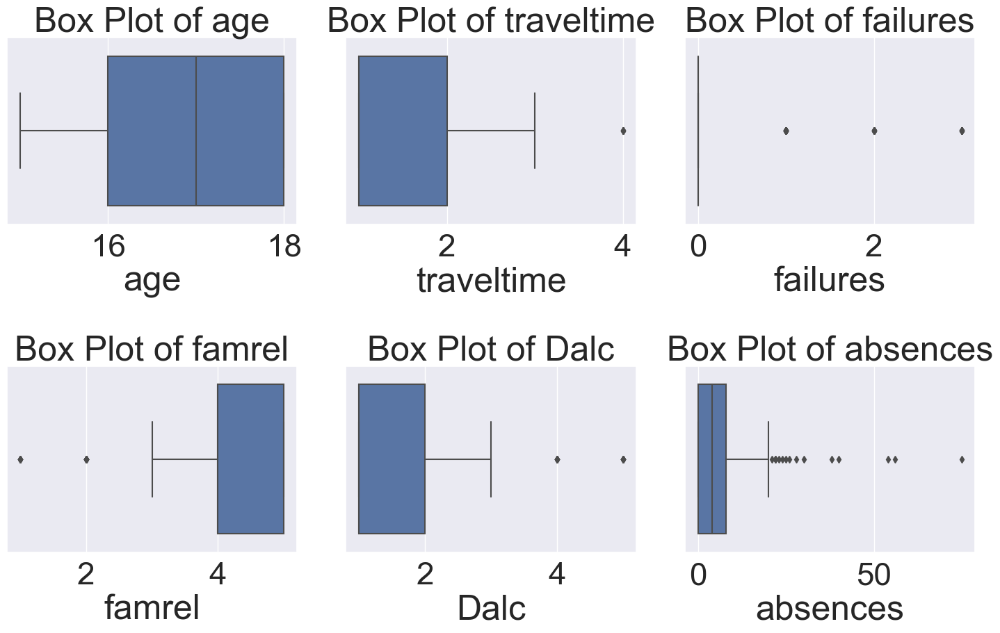

In [31]:
# features with outliers based on z-score results
outlier_features = ['age', 'traveltime', 'failures', 'famrel', 'Dalc', 'absences']

# Plot boxplots for each of the outlier features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(outlier_features, 1):
    plt.subplot(2, 3, i)  # Adjust rows/columns based on the number of features
    sns.boxplot(x=student_df[feature])
    plt.title(f'Box Plot of {feature}')

# Capping the outliers manually in the age feature
student_df['age'] = np.where(student_df['age'] > 18, 18, student_df['age'])

plt.tight_layout()
plt.show()

# Handling the outliers

In [32]:
# Capping the outliers based on IQR(feature engineering method)
def cap_outliers(df, column):
    # Calculate Q1 and Q3
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    
    # Calculate IQR
    IQR = Q3 - Q1
    
    # Define the outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap the outliers
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])
    
    return df

# Apply the capping of outliers to the 'absences' column
student_df = cap_outliers(student_df, 'absences')

In [33]:
# Capping the outliers manually in the age feature
student_df['age'] = np.where(student_df['age'] > 18, 18, student_df['age'])

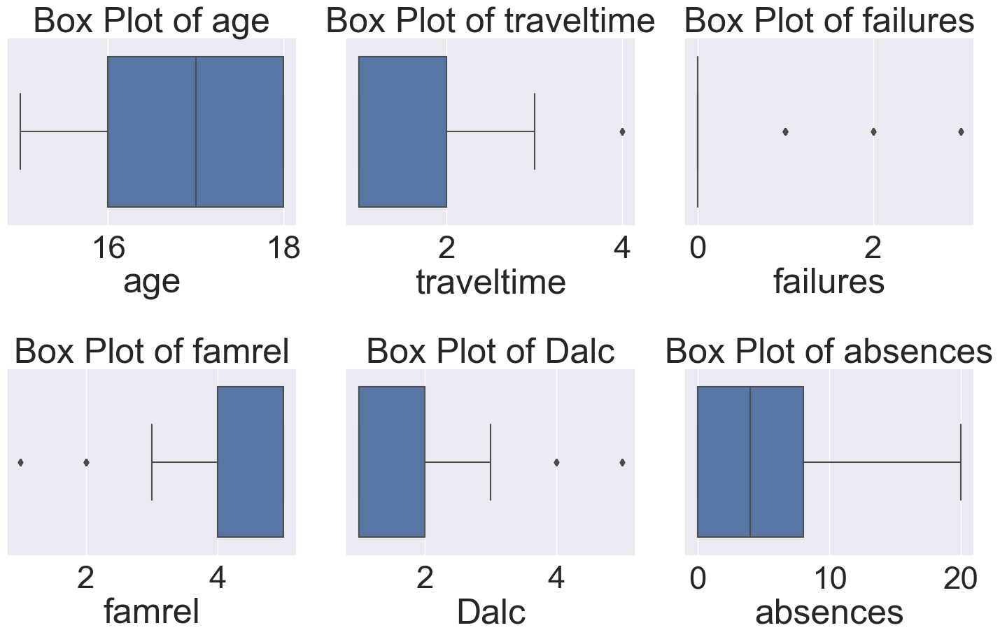

In [34]:
# features with outliers based on z-score results
outlier_features = ['age', 'traveltime', 'failures', 'famrel', 'Dalc', 'absences']

# Plot boxplots for each of the outlier features
plt.figure(figsize=(15, 10))
for i, feature in enumerate(outlier_features, 1):
    plt.subplot(2, 3, i)  # Adjust rows/columns based on the number of features
    sns.boxplot(x=student_df[feature])
    plt.title(f'Box Plot of {feature}')

# Capping the outliers manually in the age feature
student_df['age'] = np.where(student_df['age'] > 18, 18, student_df['age'])

plt.tight_layout()
plt.show()

# Data Selection

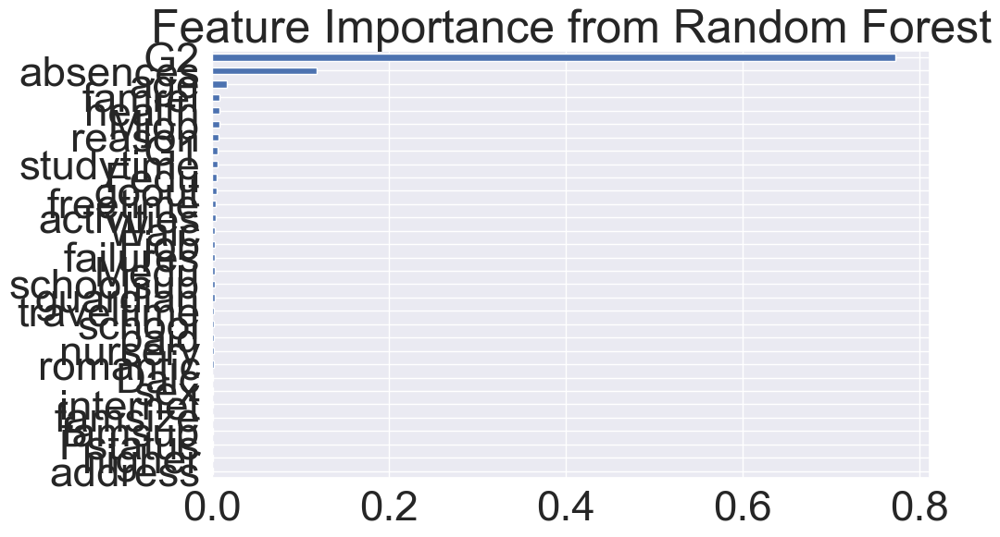

Selected Features based on Random Forest: ['G2', 'absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'G1', 'studytime', 'Fedu']


In [35]:
X = student_df.drop(['G3'], axis=1)  # Excluding these as features
Y = student_df['G3'] #target variable

# Train a Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, Y)

# Get feature importance
feature_importances = pd.Series(rf.feature_importances_, index=X.columns)

# Plot the feature importances
feature_importances.sort_values().plot(kind='barh', figsize=(10,6))
plt.title('Feature Importance from Random Forest')
plt.show()

# Keep the top features based on importance, for example, top 10 features
selected_features_rf = feature_importances.nlargest(10).index.tolist()
print("Selected Features based on Random Forest:", selected_features_rf)

In [36]:
X = student_df.drop(columns=['G3'])  # dropping the target variable(G3) from the features
y = student_df['G3']  # target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fitting the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Get coefficients
coefficients = model.coef_

# creating a DataFrame to hold feature names and their coefficients
features_df = pd.DataFrame({
    'Feature': X.columns,
    'Coefficient': coefficients
})

# Calculating the absolute coefficients for better comparison
features_df['Abs_Coefficient'] = np.abs(features_df['Coefficient'])

# Sort the DataFrame by the absolute coefficient values in descending order to see which has higher coefficient
features_df = features_df.sort_values(by='Abs_Coefficient', ascending=False)

# Display the sorted feature importances
print(features_df)

#Displaying the top 10 important features
top_n = 10
print(features_df.head(top_n))

       Feature  Coefficient  Abs_Coefficient
31          G2     0.952434         0.952434
15   schoolsup     0.681400         0.681400
18  activities    -0.582530         0.582530
14    failures    -0.457940         0.457940
22    romantic    -0.405879         0.405879
1          sex     0.333796         0.333796
23      famrel     0.306898         0.306898
19     nursery    -0.284530         0.284530
21    internet    -0.256635         0.256635
2          age    -0.247544         0.247544
0       school     0.238357         0.238357
26        Dalc    -0.205826         0.205826
30          G1     0.197531         0.197531
25       goout     0.182332         0.182332
7         Fedu    -0.143943         0.143943
16      famsup     0.137131         0.137131
12  traveltime     0.136739         0.136739
17        paid     0.131488         0.131488
9         Fjob    -0.112439         0.112439
29    absences     0.104213         0.104213
20      higher    -0.094127         0.094127
3      add

In [37]:
# the columns to keep in the dataframe
columns_to_keep_in_df = ['G2', 'absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'G1', 'studytime', 'Fedu', 
                         'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet', 'G3']

# filter the DataFrame to keep only those columns
student_df = student_df[columns_to_keep_in_df]
#Random forest w outliers : ['G2', 'absences', 'age', 'famrel', 'health', 'reason', 'Mjob', 'G1', 'studytime', 'Fedu']
#Random forest without outliers : ['G2', 'absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'G1', 'studytime', 'Fedu']
#Linear regression without cleaning : G2, schoolsup, activities, romantic, failures, sex, famrel, nursery, internet, G1
# Linear regression with cleaning : G2, schoolsup, activities, failures, romantic, sex, famrel, nursery, internet, age
student_df

,G2,absences,age,famrel,health,Mjob,reason,G1,studytime,Fedu,schoolsup,activities,failures,romantic,sex,nursery,internet,G3
0,6,6.0,18,4,3,0,0,5,2,4,1,0,0,0,0,1,0,6
1,5,4.0,17,5,3,0,0,5,2,1,0,0,0,0,0,0,1,6
2,8,10.0,15,4,3,0,2,7,2,1,1,0,3,0,0,1,1,10
3,14,2.0,15,3,5,1,1,15,3,2,0,1,0,1,0,1,1,15
4,10,4.0,16,4,5,2,1,6,2,3,0,0,0,0,0,1,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,9,11.0,18,5,4,3,0,9,2,2,0,0,2,0,1,1,0,9
391,16,3.0,17,2,2,3,0,14,1,1,0,0,0,0,1,0,1,16
392,8,3.0,18,5,3,2,0,10,1,1,0,0,3,0,1,0,0,7
393,12,0.0,18,4,5,3,0,11,1,2,0,0,0,0,1,0,1,10


In [38]:
# the columns to compare with the G3
columns_to_compare = ['G2', 'absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'G1', 'studytime', 'Fedu', 
                   'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet']

In [39]:
#shows the all the columns after being selected
student_df

,G2,absences,age,famrel,health,Mjob,reason,G1,studytime,Fedu,schoolsup,activities,failures,romantic,sex,nursery,internet,G3
0,6,6.0,18,4,3,0,0,5,2,4,1,0,0,0,0,1,0,6
1,5,4.0,17,5,3,0,0,5,2,1,0,0,0,0,0,0,1,6
2,8,10.0,15,4,3,0,2,7,2,1,1,0,3,0,0,1,1,10
3,14,2.0,15,3,5,1,1,15,3,2,0,1,0,1,0,1,1,15
4,10,4.0,16,4,5,2,1,6,2,3,0,0,0,0,0,1,0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,9,11.0,18,5,4,3,0,9,2,2,0,0,2,0,1,1,0,9
391,16,3.0,17,2,2,3,0,14,1,1,0,0,0,0,1,0,1,16
392,8,3.0,18,5,3,2,0,10,1,1,0,0,3,0,1,0,0,7
393,12,0.0,18,4,5,3,0,11,1,2,0,0,0,0,1,0,1,10


Text(0.5, 1.0, 'Correlation Heatmap with Label Encoder')

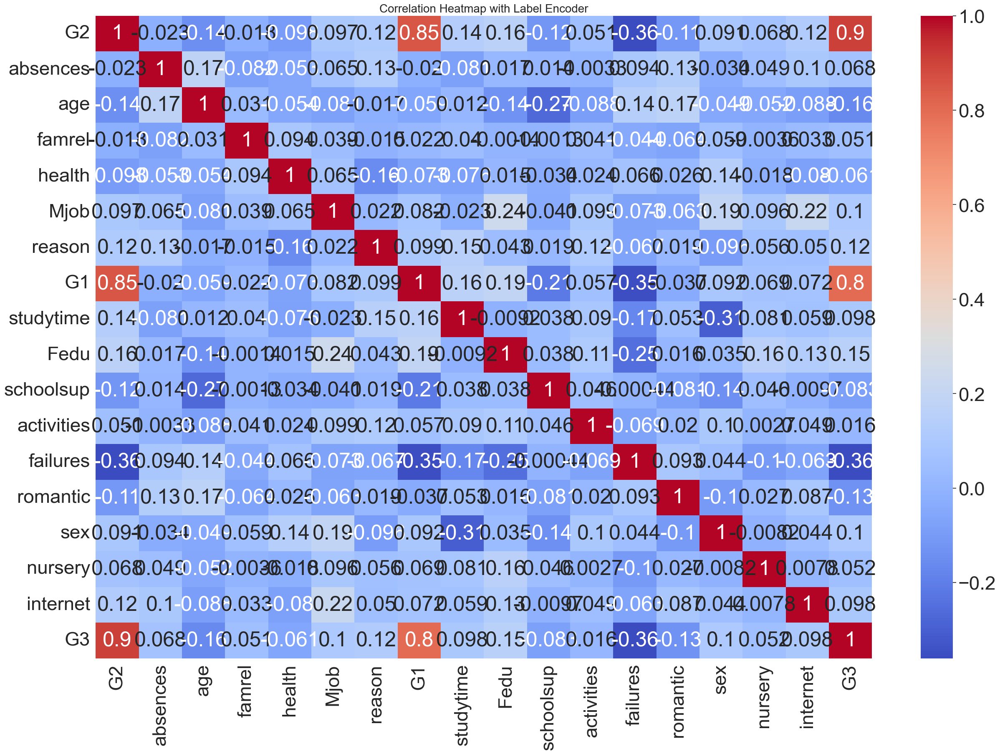

In [40]:
# Correlation matrix for selected columns
corr = student_df.corr()

# Create a figure with adjustable size
plt.figure(figsize=(30,20))

# Plot the heatmap using seaborn
sns.heatmap(corr, annot=True, cmap="coolwarm")

# Set the title of the plot
plt.title('Correlation Heatmap with Label Encoder', fontsize=20)

# Modeling

## Decision Tree Regression Model

In [30]:
#includes the G1 and G2 as features
# Separate features and target variable
features = student_df[columns_to_compare]  # Features
target = student_df['G3']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42) 

# Initialize the Decision Tree Regression(DTR) with specified parameters
DTR = DecisionTreeRegressor(random_state=100, criterion='squared_error', max_depth=30, min_samples_leaf=5)

# Train the model
DTR.fit(X_train, y_train)

# Predict on the testing data
y_pred = DTR.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
non_zero_idx = y_test != 0
mape = np.mean(np.abs((y_test[non_zero_idx] - y_pred[non_zero_idx]) / y_test[non_zero_idx])) * 100
r2 = r2_score(y_test, y_pred)

print("DTR Mean Squared Error MSE:", mse)
print("DTR Root Mean Squared Error RMSE:", rmse)
print("DTR Mean Absolute Error MAE:", mae)
print("DTR Mean Absolute Percentage Error MAPE:", mape)
print("DTR R^2 Score:", r2)

DTR Mean Squared Error MSE: 0.11095815752461322
DTR Root Mean Squared Error RMSE: 0.33310382394174526
DTR Mean Absolute Error MAE: 0.12594936708860757
DTR Mean Absolute Percentage Error MAPE: 1.4650868941697117
DTR R^2 Score: 0.9945887392467797


In [31]:
# using Gridsearch for best performancing Decision Tree Regression model 
from sklearn.model_selection import GridSearchCV
number = [5,11,13,41,42,101]
numbers = list(range(1, 31))
param_grid = {'random_state': number,
              'criterion' : ["squared_error"],
              'max_depth' : numbers,
              'min_samples_leaf' :  numbers}
grid = GridSearchCV(DecisionTreeRegressor(),param_grid,cv = 5)
grid.fit(X_train,y_train)
grid.best_params_

{'criterion': 'squared_error',
 'max_depth': 5,
 'min_samples_leaf': 1,
 'random_state': 101}

In [32]:
grid.best_estimator_

DecisionTreeRegressor(max_depth=5, random_state=101)

In [33]:
#show the optimised values
grid_predictions = grid.predict(X_test)

mse = mean_squared_error(y_test, grid_predictions)
rmse = sqrt(mse)
mae = mean_absolute_error(y_test, grid_predictions)
non_zero_idx = y_test != 0
mape = np.mean(np.abs((y_test[non_zero_idx] - grid_predictions[non_zero_idx]) / y_test[non_zero_idx])) * 100
r2 = r2_score(y_test, grid_predictions)

print("Optimised DTR Mean Squared Error MSE:", mse)
print("Optimised DTR Root Mean Squared Error RMSE:", rmse)
print("Optimised DTR Mean Absolute Error MAE:", mae)
print("Optimised DTR Mean Absolute Percentage Error MAPE:", mape)
print("Optimised DTR R^2 Score:", r2)

Optimised DTR Mean Squared Error MSE: 0.014240506329113924
Optimised DTR Root Mean Squared Error RMSE: 0.11933359262635951
Optimised DTR Mean Absolute Error MAE: 0.0189873417721519
Optimised DTR Mean Absolute Percentage Error MAPE: 0.3058321479374111
Optimised DTR R^2 Score: 0.9993055121432813


### Testing without the G1 and G2

In [34]:
#initialise a new dataframe to test without the G1 and G2
student_df_test = pd.read_csv('student.csv')

# List of categorical columns
categorical_columns = ["school", "sex", "address", "famsize", "Pstatus", "Mjob", "Fjob", "reason", "guardian",
                       "schoolsup", "famsup", "paid", "activities", "nursery", "higher", "internet", "romantic"]

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply Label Encoding
for col in categorical_columns:
    student_df_test[col] = label_encoder.fit_transform(student_df_test[col])
        
student_df.head()

,G2,absences,age,famrel,health,Mjob,reason,G1,studytime,Fedu,schoolsup,activities,failures,romantic,sex,nursery,internet,G3
0,6,6.0,18,4,3,0,0,5,2,4,1,0,0,0,0,1,0,6
1,5,4.0,17,5,3,0,0,5,2,1,0,0,0,0,0,0,1,6
2,8,10.0,15,4,3,0,2,7,2,1,1,0,3,0,0,1,1,10
3,14,2.0,15,3,5,1,1,15,3,2,0,1,0,1,0,1,1,15
4,10,4.0,16,4,5,2,1,6,2,3,0,0,0,0,0,1,0,10


In [35]:
# If G1 and G2 is dropped,
features_without_G1_G2 = ['absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'studytime', 'Fedu',
                          'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet']

# Separate features and target variable
features = student_df_test[features_without_G1_G2]  # Features
target = student_df_test['G3']  # Target variable

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42) 

# Initialize the Decision Tree Regression(DTR) with specified parameters
DTR = DecisionTreeRegressor(random_state=100, criterion='squared_error', max_depth=30, min_samples_leaf=5)

# Train the model
DTR.fit(X_train, y_train)

# Predict on the testing data
y_pred = DTR.predict(X_test)

mse = mean_squared_error(y_test, y_pred)
rmse = sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
non_zero_idx = y_test != 0
mape = np.mean(np.abs((y_test[non_zero_idx] - y_pred[non_zero_idx]) / y_test[non_zero_idx])) * 100
r2 = r2_score(y_test, y_pred)

print("DTR Mean Squared Error MSE:", mse)
print("DTR Root Mean Squared Error RMSE:", rmse)
print("DTR Mean Absolute Error MAE:", mae)
print("DTR Mean Absolute Percentage Error MAPE:", mape)
print("DTR R^2 Score:", r2)

DTR Mean Squared Error MSE: 22.74611281737261
DTR Root Mean Squared Error RMSE: 4.769288502216301
DTR Mean Absolute Error MAE: 3.68451878641752
DTR Mean Absolute Percentage Error MAPE: 33.39604150206254
DTR R^2 Score: -0.10929336177618887


## Random Forest Regressor Model

In [50]:
# G1, G2 is included
# Define features and target
features = student_df[columns_to_compare]  # Features
target = student_df['G3']  # Target variable

# Random Forest model
model = RandomForestRegressor(random_state=42)

# Create the pipeline
pipeline = Pipeline([
    ('regressor', model)
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=100)

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred_test = pipeline.predict(X_test)

# Evaluate the model
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # Calculate MAPE, ignoring zero values in y_true
    non_zero = (y_true != 0)
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    
    return {
        'RFR Mean Squared Error MSE': mse,
        'RFR Root Mean Squared Error RMSE': rmse,
        'RFR Mean Absolute Error MAE': mae,
        'RFR Mean Absolute Percentage Error MAPE': mape,
        'RFR R^2 Score': r2
    }

# Evaluate the model on the test set
metrics = evaluate_model(y_test, y_pred_test)

# Print performance metrics
print("Performance:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Performance:
RFR Mean Squared Error MSE: 2.9040
RFR Root Mean Squared Error RMSE: 1.7041
RFR Mean Absolute Error MAE: 0.9471
RFR Mean Absolute Percentage Error MAPE: 7.9793
RFR R^2 Score: 0.7942


### Testing without G1 and G2

In [38]:
# G1, G2 is no included
# Define features and target
features_without_G1_G2 = ['absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'studytime', 'Fedu',
                          'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet']

features = student_df[features_without_G1_G2]  # Features
target = student_df['G3']  # Target variable

# Random Forest model
model = RandomForestRegressor(random_state=42)

# Create the pipeline
pipeline = Pipeline([
    ('regressor', model)
])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=100)

# Fit the model
pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred_test = pipeline.predict(X_test)

# Evaluate the model
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # Calculate MAPE, ignoring zero values in y_true
    non_zero = (y_true != 0)
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    
    return {
        'RFR Mean Squared Error MSE': mse,
        'RFR Root Mean Squared Error RMSE': rmse,
        'RFR Mean Absolute Error MAE': mae,
        'RFR Mean Absolute Percentage Error MAPE': mape,
        'RFR R^2 Score': r2
    }

# Evaluate the model on the test set
metrics = evaluate_model(y_test, y_pred_test)

# Print performance metrics
print("Performance:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Performance:
RFR Mean Squared Error MSE: 9.3729
RFR Root Mean Squared Error RMSE: 3.0615
RFR Mean Absolute Error MAE: 2.4848
RFR Mean Absolute Percentage Error MAPE: 20.9985
RFR R^2 Score: 0.3359


## Support Vector Machines Model

In [86]:
# G1, G2 is included
# Define features and target
features = student_df[columns_to_compare]  # Features
target = student_df['G3']  # Target variable

# Function to evaluate model
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # Calculate MAPE
    non_zero = (y_true != 0)
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    
    return {
        'SVM Mean Squared Error MSE': mse,
        'SVM Root Mean Squared Error RMSE': rmse,
        'SVM Mean Absolute Error MAE': mae,
        'SVM Mean Absolute Percentage Error MAPE': mape,
        'SVM R^2 Score': r2
    }

# Preprocessor:  impute and scale
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), columns_to_compare)
    ])

# Create the pipeline with SVM
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('svr', model)
])

# Define the hyperparameter grid for GridSearch
param_grid = {
    'svr__kernel': ['linear', 'rbf', 'poly'],
    'svr__C': [0.1, 1, 10, 100],  # Regularization parameter
    'svr__epsilon': [0.01, 0.1, 0.2, 0.5],  # Epsilon tube
}

# Split the dataset into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Define the Support Vector Regression  model
model = SVR()

# Set up GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
# Fit the model on the entire dataset
grid_search.fit(X_train, y_train)
# Make predictions on the entire dataset
best_model = grid_search.best_estimator_
# Make predictions on the test set
y_pred = best_model.predict(X_test)
# Evaluate the model
metrics = evaluate_model(y_test, y_pred)

print("Performance: ")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Performance: 
SVM Mean Squared Error MSE: 4.3241
SVM Root Mean Squared Error RMSE: 2.0794
SVM Mean Absolute Error MAE: 1.1381
SVM Mean Absolute Percentage Error MAPE: 7.8174
SVM R^2 Score: 0.7891


### Testing without G1 and G2

In [88]:
# G1, G2 is no included
# Define features and target
features_without_G1_G2 = ['absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'studytime', 'Fedu',
                          'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet']

features = student_df[features_without_G1_G2]  # Features
target = student_df['G3']  # Target variable

# Function to evaluate model
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # Calculate MAPE
    non_zero = (y_true != 0)
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    
    return {
        'SVM Mean Squared Error MSE': mse,
        'SVM Root Mean Squared Error RMSE': rmse,
        'SVM Mean Absolute Error MAE': mae,
        'SVM Mean Absolute Percentage Error MAPE': mape,
        'SVM R^2 Score': r2
    }

# Preprocessor:  impute and scale
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), features_without_G1_G2)
    ])

# Create the pipeline with SVM
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('svr', model)
])

# Define the hyperparameter grid for GridSearch
param_grid = {
    'svr__kernel': ['linear', 'rbf', 'poly'],
    'svr__C': [0.1, 1, 10, 100],  # Regularization parameter
    'svr__epsilon': [0.01, 0.1, 0.2, 0.5],  # Epsilon tube
}


# Split the dataset into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
# Define the Support Vector Regression  model
model = SVR()

# Set up GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')
# Fit the model on the entire dataset
grid_search.fit(X_train, y_train)
# Make predictions on the entire dataset
best_model = grid_search.best_estimator_
# Make predictions on the test set
y_pred = best_model.predict(X_test)
# Evaluate the model
metrics = evaluate_model(y_test, y_pred)

print("Performance: ")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Performance: 
SVM Mean Squared Error MSE: 17.3669
SVM Root Mean Squared Error RMSE: 4.1674
SVM Mean Absolute Error MAE: 3.3000
SVM Mean Absolute Percentage Error MAPE: 28.3173
SVM R^2 Score: 0.1530


### Linear Regression Model

In [52]:
# G1, G2 is included
# Define features and target
features = student_df[columns_to_compare]  # Features
target = student_df['G3']  # Target variable

# Define a function to evaluate the model
def evaluate_model(X, y, columns_to_compare):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create column transformer for numerical preprocessing
    preprocessor = ColumnTransformer(transformers=[
        ('num', StandardScaler(), columns_to_compare)
    ])

    # Create a pipeline with preprocessing and linear regression
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', LinearRegression())
    ])

    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Compute metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Filter out zero values from y_test to avoid division by zero
    non_zero_idx = y_test != 0
    y_test_non_zero = y_test[non_zero_idx]
    y_pred_non_zero = y_pred[non_zero_idx]
    mape = np.mean(np.abs((y_test_non_zero - y_pred_non_zero) / y_test_non_zero)) * 100

    r_squared = r2_score(y_test, y_pred)

    return mse, rmse, mae, mape, r_squared

# Evaluate the model with G1 and G2
print("Performance:")
mse, rmse, mae, mape, r_squared = evaluate_model(features, target, columns_to_compare)
print(f"LR Mean Squared Error: {mse:.4f}")
print(f"LR Root Mean Squared Error: {rmse:.4f}")
print(f"LR Mean Absolute Error: {mae:.4f}")
print(f"LR Mean Absolute Percentage Error: {mape:.4f}")
print(f"LR R-squared: {r_squared:.4f}")

Performance:
LR Mean Squared Error: 4.9764
LR Root Mean Squared Error: 2.2308
LR Mean Absolute Error: 1.4951
LR Mean Absolute Percentage Error: 11.9985
LR R-squared: 0.7573


### Testing without G1 and G2

In [46]:
# G1, G2 is no included
# Define features and target
features_without_G1_G2 = ['absences', 'age', 'famrel', 'health', 'Mjob', 'reason', 'studytime', 'Fedu',
                          'schoolsup', 'activities', 'failures', 'romantic', 'sex', 'nursery', 'internet']

features = student_df[features_without_G1_G2]  # Features
target = student_df['G3']  # Target variable

# Define a function to evaluate the model
def evaluate_model(X, y, features_without_G1_G2):
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create column transformer for numerical preprocessing
    preprocessor = ColumnTransformer(transformers=[
        ('num', StandardScaler(), features_without_G1_G2)
    ])

    # Create a pipeline with preprocessing and linear regression
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', LinearRegression())
    ])

    # Fit the model to the training data
    model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Compute metrics
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Filter out zero values from y_test to avoid division by zero
    non_zero_idx = y_test != 0
    y_test_non_zero = y_test[non_zero_idx]
    y_pred_non_zero = y_pred[non_zero_idx]
    mape = np.mean(np.abs((y_test_non_zero - y_pred_non_zero) / y_test_non_zero)) * 100

    r_squared = r2_score(y_test, y_pred)

    return mse, rmse, mae, mape, r_squared

# Evaluate the model with G1 and G2
print("Performance:")
mse, rmse, mae, mape, r_squared = evaluate_model(features, target, features_without_G1_G2)
print(f"LR Mean Squared Error: {mse:.4f}")
print(f"LR Root Mean Squared Error: {rmse:.4f}")
print(f"LR Mean Absolute Error: {mae:.4f}")
print(f"LR Mean Absolute Percentage Error: {mape:.4f}")
print(f"LR R-squared: {r_squared:.4f}")

Performance:
LR Mean Squared Error: 18.6747
LR Root Mean Squared Error: 4.3214
LR Mean Absolute Error: 3.4332
LR Mean Absolute Percentage Error: 29.2771
LR R-squared: 0.0893


# Combined All Model For Evaluation

In [44]:
features = student_df[columns_to_compare]
target = student_df['G3']

# Split the dataset into training and test sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Function to evaluate the model
def evaluate_model(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # Calculate MAPE, ignoring zero values in y_true
    non_zero = (y_true != 0)
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100 if non_zero.any() else np.nan
    
    return {
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'MAPE': mape,
        'R²': r2
    }

# ----------- Model 1: Support Vector Regression (SVR) -----------
svr_model = SVR()

svr_pipeline = Pipeline([
    ('svr', svr_model)
])

param_grid_svr = {
    'svr__kernel': ['linear', 'rbf', 'poly'],
    'svr__C': [0.1, 1, 10, 100],
    'svr__epsilon': [0.01, 0.1, 0.2, 0.5]
}

grid_search_svr = GridSearchCV(svr_pipeline, param_grid_svr, cv=5, scoring='neg_mean_squared_error')
grid_search_svr.fit(X_train, y_train)

best_svr_model = grid_search_svr.best_estimator_

y_pred_svr = best_svr_model.predict(X_test)
svr_metrics = evaluate_model(y_test, y_pred_svr)

# ----------- Model 2: Random Forest Regressor (RFR) -----------
rfr_model = RandomForestRegressor(random_state=42)

rfr_pipeline = Pipeline([
    ('regressor', rfr_model)
])

rfr_pipeline.fit(X_train, y_train)
y_pred_rfr = rfr_pipeline.predict(X_test)
rfr_metrics = evaluate_model(y_test, y_pred_rfr)

# ----------- Model 3: Decision Tree Regressor (DTR) -----------
dtr_model = DecisionTreeRegressor(random_state=100, criterion='squared_error', max_depth=30, min_samples_leaf=5)

dtr_pipeline = Pipeline([
    ('regressor', dtr_model)
])

dtr_pipeline.fit(X_train, y_train)
y_pred_dtr = dtr_pipeline.predict(X_test)
dtr_metrics = evaluate_model(y_test, y_pred_dtr)

# ----------- Model 4: Linear Regression (LR) -----------
lr_model = LinearRegression()

lr_pipeline = Pipeline([
    ('regressor', lr_model)
])

lr_pipeline.fit(X_train, y_train)
y_pred_lr = lr_pipeline.predict(X_test)
lr_metrics = evaluate_model(y_test, y_pred_lr)

# ----------- Results -----------
results = pd.DataFrame({
    'Performance Metric': ['MSE', 'RMSE', 'MAE', 'MAPE', 'R²'],
    'SVM': list(svr_metrics.values()),
    'Random Forest': list(rfr_metrics.values()),
    'Decision Tree': list(dtr_metrics.values()),
    'Linear Regression': list(lr_metrics.values())
})

# Print the results
pd.set_option('display.width', 1000) 
pd.set_option('display.max_columns', None) 
print(results.to_string())

  Performance Metric        SVM  Random Forest  Decision Tree  Linear Regression
0                MSE   4.048279       3.659070       5.212572           4.976443
1               RMSE   2.012034       1.912869       2.283106           2.230794
2                MAE   1.284177       1.129241       1.323287           1.495111
3               MAPE  10.357239       9.713797      11.710844          11.998501
4                 R²   0.802572       0.821553       0.745791           0.757306


     Actual  SVR Prediction  Random Forest Prediction  Decision Tree Prediction  Linear Regression Prediction
78       10        5.603082                      8.38                  9.200000                      6.179389
371      12       11.804336                     11.57                 11.166667                     11.220453
248       5        6.021253                      6.52                  6.428571                      3.191889
55       10        9.130116                      9.69                 10.166667                      8.295110
390       9        9.948491                      9.41                 10.166667                      9.041817


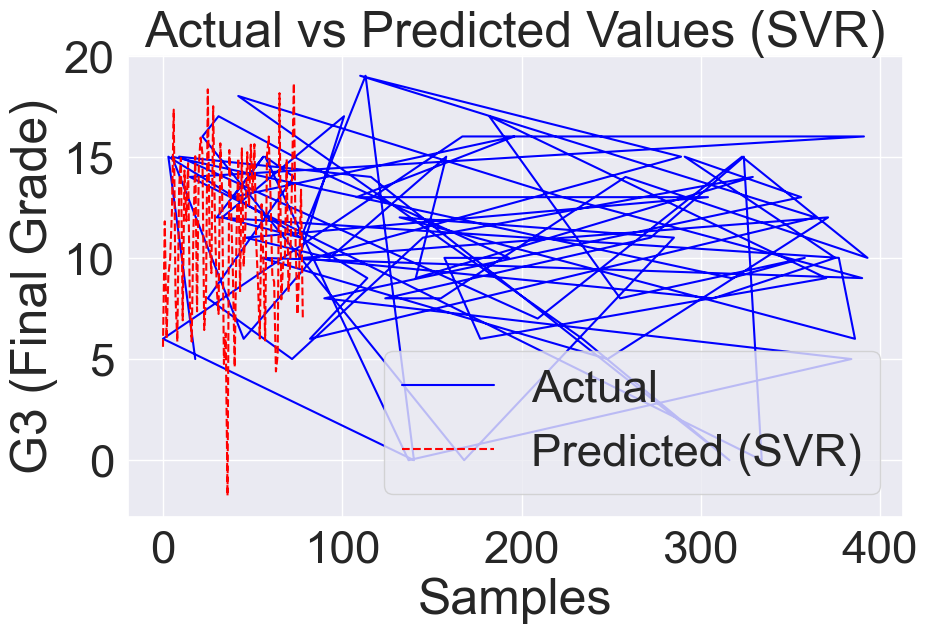

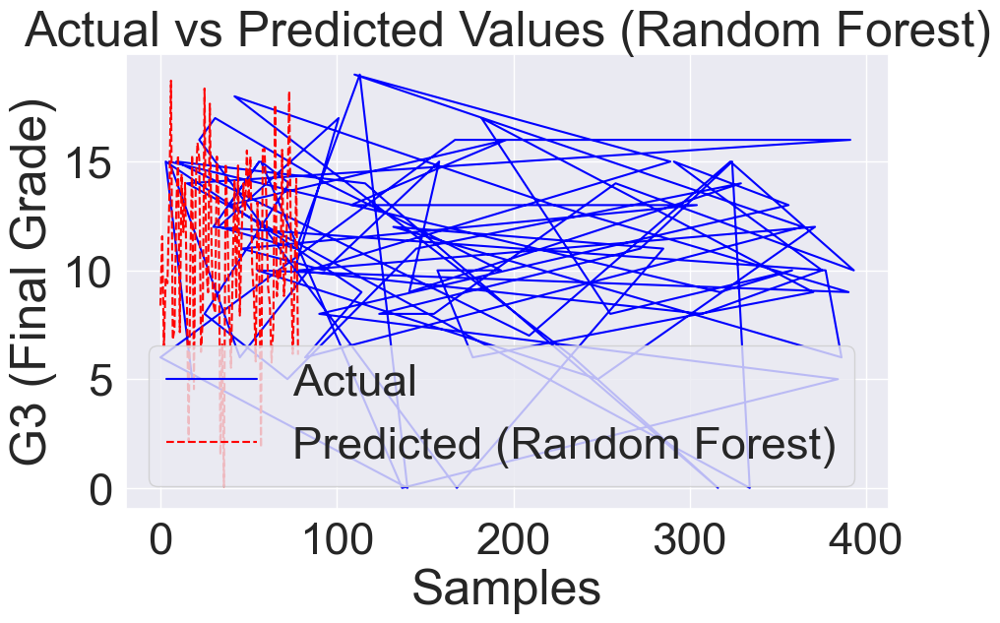

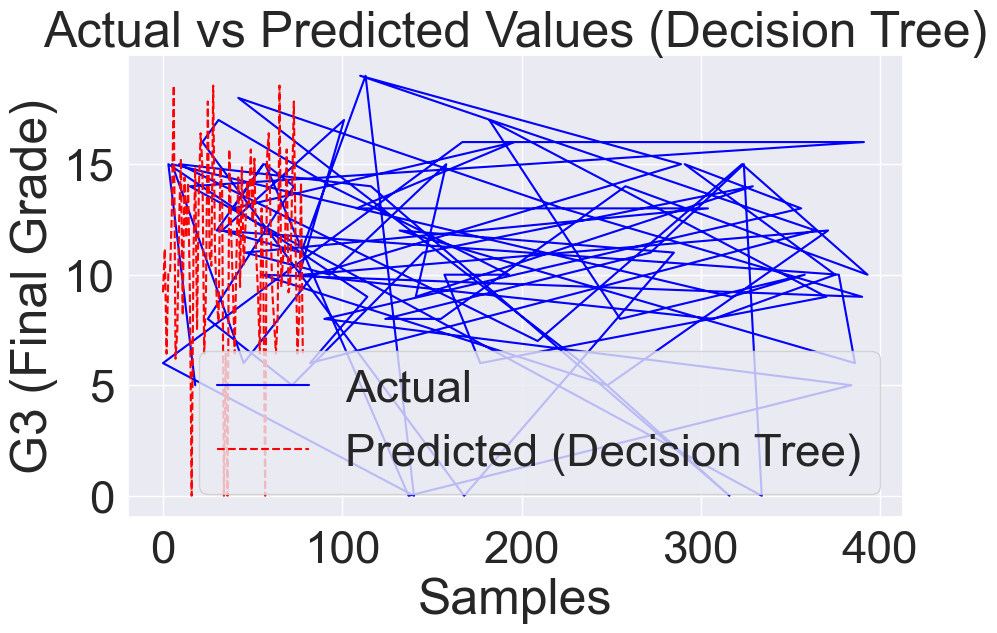

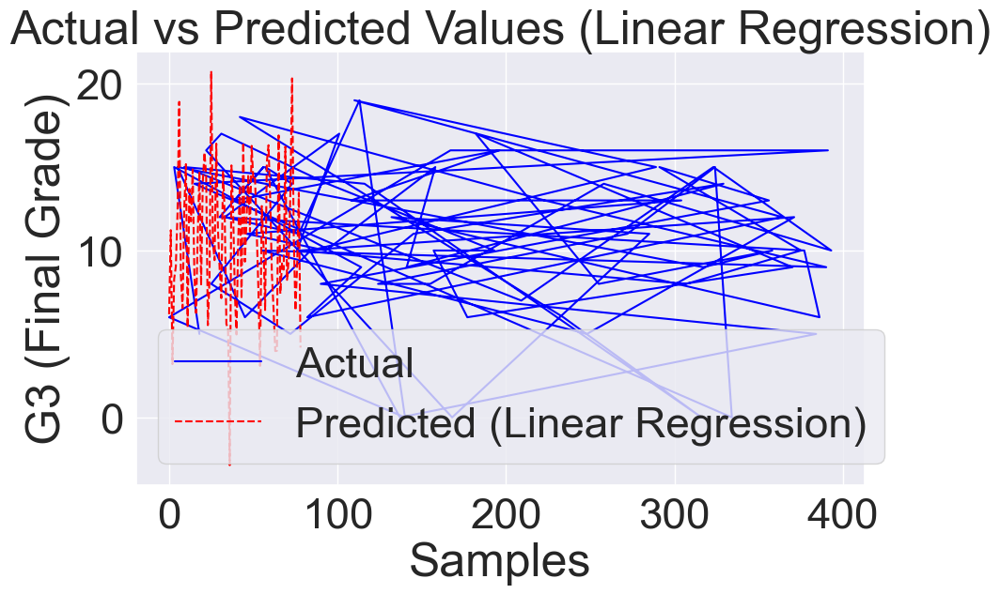

In [45]:
comparison_df = pd.DataFrame({
    'Actual': y_test,
    'SVR Prediction': y_pred_svr,
    'Random Forest Prediction': y_pred_rfr,
    'Decision Tree Prediction': y_pred_dtr,
    'Linear Regression Prediction': y_pred_lr
})

# Print the comparison table
print(comparison_df.head())

# Function to plot actual and predicted values
def plot_comparison(model_name, actual, predicted):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual', color='blue')
    plt.plot(predicted, label=f'Predicted ({model_name})', color='red', linestyle='dashed')
    plt.title(f'Actual vs Predicted Values ({model_name})')
    plt.xlabel('Samples')
    plt.ylabel('G3 (Final Grade)')
    plt.legend()
    plt.show()

# Plot comparisons for each model
plot_comparison('SVR', y_test, y_pred_svr)
plot_comparison('Random Forest', y_test, y_pred_rfr)
plot_comparison('Decision Tree', y_test, y_pred_dtr)
plot_comparison('Linear Regression', y_test, y_pred_lr)

###  Deployment with Random Forest Regression Model

In [ ]:
# Create a Pickle file using serialization
#converting a Python object into a byte stream to store it in a binary file 
# maintain program state across sessions, or transport data over the network
pickle_out = open("RFR.pkl", "wb")

with open('RFR.pkl', 'wb') as pickle_out:
    pickle.dump(rfr_pipeline, pickle_out)
